# Libraries

In [1]:
#Basic Operating System Stuff
import os, gc, random

#Basic dataframe, array, and math stuff
import pandas as pd #data frame
import math #math functions
import numpy as np    #numerical package
#import nibabel as nib #package to read MRIs

#Scikit learn
import sklearn as sk  #scikit learn
from sklearn import metrics
from sklearn.model_selection import train_test_split as tts #train test split
from sklearn.metrics import confusion_matrix, roc_curve, classification_report #for 2-class model
from sklearn.preprocessing import MinMaxScaler as MMS

#Tensorflow
import tensorflow as tf 
from tensorflow.python.client import device_lib #GPU Check
import tensorflow.keras #keras
from tensorflow.keras import layers 
from tensorflow.keras import Sequential,Input,Model 
from tensorflow.keras.layers import Dense, Dropout, Flatten, Input, Add, Activation, ZeroPadding2D,GlobalAveragePooling2D
from tensorflow.keras.layers import BatchNormalization,Conv2D, Conv3D,AveragePooling2D, MaxPooling2D, MaxPooling3D,GlobalMaxPooling2D, LeakyReLU  
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau, ModelCheckpoint #use for early stopping and reduction on level-out
from tensorflow.keras.initializers import glorot_uniform, he_uniform #to initialize random weights for filters
from tensorflow.keras.preprocessing.image import ImageDataGenerator 
from tensorflow.keras.preprocessing import image as image_utils
from tensorflow.keras.applications.imagenet_utils import preprocess_input, decode_predictions, preprocess_input
from tensorflow.keras.models import Model, load_model  #Can't do much without a model
from tensorflow.keras import utils
from tensorflow.keras.utils import get_file, plot_model, to_categorical, model_to_dot
from tensorflow.keras.preprocessing import image
from tensorflow.keras.applications import ResNet50V2, MobileNetV2, VGG16, ResNet152
import tensorflow.keras.backend as K #let's write our own metrics and loss functions

#Graphing
import cv2
from PIL import Image
import matplotlib.pyplot as plt
import pydicom as dicom
from glob import glob

print(device_lib.list_local_devices()) #Let's see if Python recognizes my GPU, shall we?


[name: "/device:CPU:0"
device_type: "CPU"
memory_limit: 268435456
locality {
}
incarnation: 2319458503446160367
xla_global_id: -1
, name: "/device:GPU:0"
device_type: "GPU"
memory_limit: 14236516352
locality {
  bus_id: 1
  links {
  }
}
incarnation: 1933093509283759075
physical_device_desc: "device: 0, name: NVIDIA GeForce RTX 3080 Ti Laptop GPU, pci bus id: 0000:01:00.0, compute capability: 8.6"
xla_global_id: 416903419
]


# GPU / Memory Management

In [2]:
#Define function for clearing GPU memory
def reset_keras():
    tensorflow.keras.backend.clear_session
    gc.collect()
reset_keras()

# Read Images

In [3]:
myf=glob("C:/cygwin64/home/lfult/physionet.org/files/mimic-cxr/2.0.0/files/p10/**/**/*.dcm")  #load file names of *img type
len(myf)

36681

# Plot

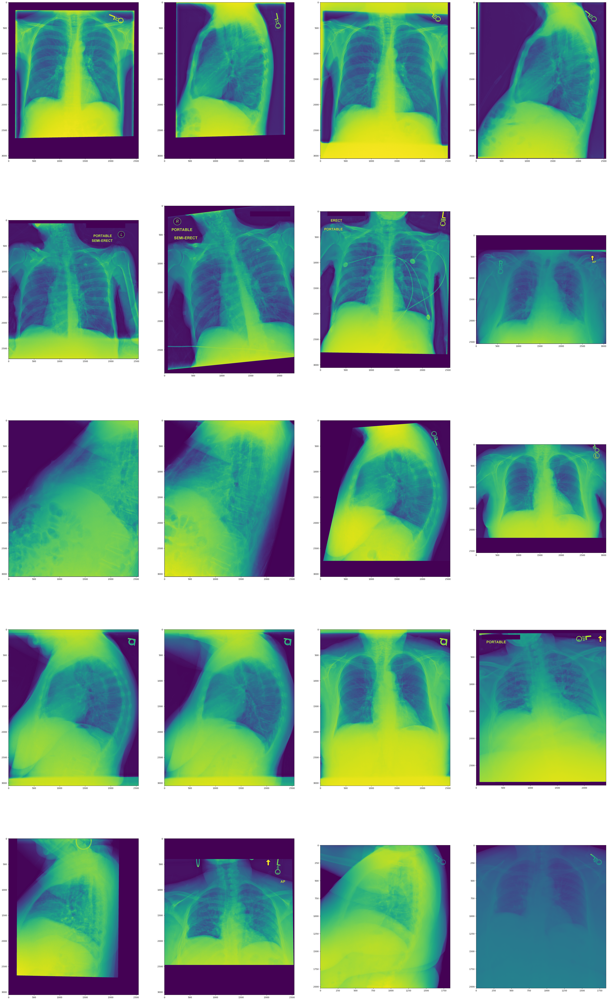

In [4]:
fig, ax = plt.subplots(5,4,figsize=[50,85])
k=0
ds=[]
for i in range(5):
    for j in range(4):
        tmp=dicom.dcmread(myf[k])
        ax[i,j].imshow(tmp.pixel_array)
        k+=1     